
# Проектная работа
# *Рынок заведений общественного питания Москвы*

**Описание проекта**

От инвесторов фонда «Shut Up and Take My Money» поступило задание по исследованию рынка общественного питания Москвы для последующего открытия нового заведения. 

Работа проводится с датасетом, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В нем содержится информация о заведениях общественного питания Москвы.

**Целью** исследования является изучение рынка общественного питания в Москве за 2022г. 

**Результат исследования** позволит инвесторам подобрать наиболее подходящий бизнес-план для открытия новой кофейни в Москве.

**В ходе** исследования мы
- проведем анализ данных,
- выявим особенности данного рынка,
- сформулируем рекомендации для открытия нового заведения,
- подготовим презентацию исследования для инвесторов. 

**Этапы работы:**
1. [Сбор данных](#title1) - выгрузим необходимые библиотеки данных по работе с данными и их визуализацией и изучим общую информацию в исходной таблице;
2. [Предобработка данных](#title2) - проведем подготовку выгруженных данных, проверим их тип, наличие пропущенных значений, продублированных строк;
3. [Анализ](#title3) - на основе уже обработанных данных проведем статистические рассчеты и выявим особенности рынка общественного питания в Москве за 2022г;
4. [Общий вывод](#title4) - рассмотрим результаты проведенного исследования;
5. [Предложения для открытия нового заведения](#title5) - сформулируем рекомендации для открытия новой кофейни в Москве по результатам более детального анализа данных, касаемо категории кофеен;
6. [Презентация](#title6) - подготовим презентацию исследования для инвесторов.

## Сбор данных
<a id="title1"></a>

1) **Выгрузим необходимые библиотеки данных по работе с данными и их визуализацией и изучим общую информацию в исходной таблице.**

Импортируем необходимые библиотеки для последующей работы с данными. 
Для визуального сопровождения анализа данных нам потребуются также библиотеки, ответственные за составление графиков и диаграмм, а также для построения карт и хранения географических структур данных.

In [1]:
#Это у нас будут данные
import pandas as pd

#А это у нас будет визуал
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#А это будут карты и все, что с ними связано
import folium
import json

<div class="alert alert-block alert-success">

**Комментарий ревьювера (все отлично)**
    
Правильно, что импортируешь необходимые библиотеки в первой ячейке. Так твой коллега, запускающий работу, будет в курсе используемых в ней библиотек и сможет настроить свое окружение при необходимости.
</div>

В этом датасете содержится информация из сервисов Яндекс Карты и Яндекс Бизнес на лето 2022г, включающая название заведения, его категория, адрес и район расположения, информация о времени работы, географические данные (широта, долгота), рейтинг заведения, категория цен, средняя стоимость (блюда, чашки кофе, бокала пива и тд), сетевое ли заведение и количество мест.

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv') 
display(data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Чтобы открыть общую информацию воспользуемся методом info(). 

Мы видим, что в таблице 8406 строк и 14 столбцов, во многих их них есть пропуски. 

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


2) **Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?**

Каждая строка подразумевает 1 заведение, соответственно, у нас в датасете имеется 8406 заведений.

Полностью заполненных столбцов у нас 8:

- name — строковый тип данных,
- address — строковый тип данных,
- category — строковый тип данных,
- district — строковый тип данных,
- lat — вещественный тип данных (географические координаты записаны в виде дробного числа),
- lng — вещественный тип данных (географические координаты записаны в виде дробного числа),
- rating — вещественный тип данных (рейтинг записан в виде дробного числа),
- chain — целочисленный тип данных.

Столбцы, в которых имеются пропуски:

- hours — строковый тип данных, (помимо информации о часах, в этом столбце содержится также режим работы),
- price — строковый тип данных,
- avg_bill — строковый тип данных, (например: «Средний счёт: 1000–1500 ₽»)
- middle_avg_bill — вещественный тип данных, 
- middle_coffee_cup — вещественный тип данных 
- seats — вещественный тип данных.

**Таким образом мы выполнили ПЕРВЫЙ ЭТАП работы по сбору первичных данных.**

Для этого мы:
1. импортировали необходимые библиотеки,
2. загрузили исходную таблицу,
2. изучили общую информацию о таблице.

## Предобработка данных
<a id="title2"></a>

1) **Пропущенные значения в столбцах** 

Первым делом с помощью комбинации методов isna() и sum() посмотрим, количество пропущенных значений в этих столбцах.

In [4]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В столбце hours - 536 пропусков (менее 10%), но если удалить все эти строки из-за одного пропуска, потеряются важные данные из других столбцов. 

Оценим процентное соотношение пропущенных значений к общему числу строк. Благодаря цветному оформлению сразу видны столбцы с максимальным количеством пропущенных значений - middle_coffee_cup (94%), middle_avg_bill (63%), price (61%), avg_bill (55%), seats (43%).

Данные, которые хранятся в этих строках, нужны для дальнейшего исследования. Их мы тоже ни в коем случае удалять не будем.

In [5]:
pd.DataFrame(round(data.isna().mean()*100 ,)).style.background_gradient('gist_earth_r')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Далее для исследования мы можем поставить заглушки в столбцах со строковыми значениями. При анализе по данным столбцам заглушку мы сможем отфильтровать.

In [6]:
data['hours'] = data['hours'].fillna('unknown')
data['price'] = data['price'].fillna('unknown')
data['avg_bill'] = data['avg_bill'].fillna('unknown')

In [7]:
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('gist_earth_r')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,0.000000
avg_bill,0.000000


**Таким образом**, на этом шаге мы изучили пропуски в нашем датафрейме:

1. вывели информацию о проценте и количестве пропусков в каждом столбце,
2. в столбцах middle_coffee_cup, middle_avg_bill,  seats решили оставить пропуски, потому что по большей части они не влияют на исследование,
4. в столбцах hours, price, avg_bill заполнили пропуски заглушками.

2) **Наличие дубликатов в строках** 

- **Явные дубликаты**

Сначала узнаем, есть ли среди всех строк явные дубликаты. Таковых не оказалось, каждая строка уникальна.

In [8]:
data.duplicated().sum()

0

Явных дубликатов нет, но поскольку у нас датасет состоял из данных, вносимых в сервисы автоматически или вручную. Нужно проверить, есть ли заведения, которые имеют одино название и находятся по одному и тому же адресу, только, допустим, различаются по причастности к сетям или ошибочно внесены разные округа Москвы. Таких заведений нет.

In [9]:
data[['name', 'address']].duplicated().sum()

0

- **Неявные дубликаты**

***Столбец name***

Теперь узнаем, есть ли в названиях заведений записанные по-разному одни и те же названия. Приведем в строковый тип данных к единому нижнему регистру.

In [10]:
#len(data['name'].unique())
#было 5614

data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.strip()

#len(data['name'].unique())
#стало5512

Также, пока рассматривала данные нашла, что есть записи 'яндекс лавка' и 'яндекс.лавка'. Исправим на 'яндекс лавка'

In [11]:
data[data['name'].str.contains(r'\янд')].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
162,яндекс лавка,ресторан,"Москва, Дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.881291,37.539301,4.3,unknown,unknown,NaN,NaN,1,NaN
193,яндекс лавка,ресторан,"Москва, Алтуфьевское шоссе, 79А, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.886778,37.584891,3.3,unknown,unknown,NaN,NaN,1,NaN
212,яндекс лавка,ресторан,"Москва, Алтуфьевское шоссе, 50",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.877394,37.587687,4.2,unknown,unknown,NaN,NaN,1,22.0
836,яндекс лавка,ресторан,"Москва, Дубнинская улица, 12, корп. 2",Северный административный округ,unknown,55.864447,37.569733,4.0,unknown,unknown,NaN,NaN,1,124.0
1041,яндекс лавка,ресторан,"Москва, улица Лётчика Бабушкина, 15",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.863546,37.673501,4.2,unknown,unknown,NaN,NaN,1,NaN
1153,яндекс лавка,ресторан,"Москва, Будайский проезд, 1",Северо-Восточный административный округ,"ежедневно, 07:00–02:00",55.834932,37.664534,2.9,unknown,unknown,NaN,NaN,1,NaN
1206,яндекс.лавка,ресторан,"Москва, Таллинская улица, 14",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.798612,37.400494,4.1,unknown,unknown,NaN,NaN,1,NaN
1443,яндекс лавка,ресторан,"Москва, Большой Волоколамский проезд, 12, корп...",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.801175,37.494331,4.0,unknown,unknown,NaN,NaN,1,NaN
1530,яндекс лавка,ресторан,"Москва, улица Викторенко, 16, стр. 5",Северный административный округ,"ежедневно, 07:00–00:00",55.794391,37.522755,4.2,unknown,unknown,NaN,NaN,1,NaN
1533,яндекс лавка,ресторан,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,"ежедневно, 07:00–00:00",55.815155,37.512728,4.2,unknown,unknown,NaN,NaN,1,180.0


In [12]:
yandex_name = data.query('name == "яндекс.лавка"')
yandex_name

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1206,яндекс.лавка,ресторан,"Москва, Таллинская улица, 14",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.798612,37.400494,4.1,unknown,unknown,NaN,NaN,1,NaN
3107,яндекс.лавка,ресторан,"Москва, улица Академика Павлова, 50",Западный административный округ,"ежедневно, 07:00–00:00",55.746817,37.409400,2.8,unknown,unknown,NaN,NaN,1,NaN
5201,яндекс.лавка,ресторан,"Москва, улица Большие Каменщики, 9сИ",Центральный административный округ,"ежедневно, 07:00–02:00",55.738444,37.655364,3.5,unknown,unknown,NaN,NaN,1,NaN


In [13]:
data['name'] = data['name'].replace('яндекс.лавка', 'яндекс лавка')

In [14]:
data[['name', 'address']].duplicated().sum()

3

***Столбец address***

Теперь узнаем, есть ли в столбце с адресами записанные по-разному одни и те же улицы.

In [15]:
#len(data['address'].unique())
#было 5753

data['address'] = data['address'].str.lower()
data['address'] = data['address'].str.strip()

#len(data['address'].unique())
#5752

Столбцы address и namе

После того, как мы привели оба этих столбца к единому регистру, снова проверим, есть ли продублированные заведения с одним названием и по одному и тому же адресу.

In [16]:
data[['name', 'address']].duplicated().sum()

4

Появилось 4 таких заведения. Поскольку это небольшая часть датафрейма, то можно удалить эти строки.

In [17]:
data[['name', 'address']].drop_duplicates().reset_index()

,index,name,address
0,0,wowфли,"москва, улица дыбенко, 7/1"
1,1,четыре комнаты,"москва, улица дыбенко, 36, корп. 1"
2,2,хазри,"москва, клязьминская улица, 15"
3,3,dormouse coffee shop,"москва, улица маршала федоренко, 12"
4,4,иль марко,"москва, правобережная улица, 1б"
...,...,...,...
8397,8401,суши мания,"москва, профсоюзная улица, 56"
8398,8402,миславнес,"москва, пролетарский проспект, 19, корп. 1"
8399,8403,самовар,"москва, люблинская улица, 112а, стр. 1"
8400,8404,чайхана sabr,"москва, люблинская улица, 112а, стр. 1"


***Столбец district***

Теперь узнаем, есть ли в столбце с административными раонами записанные по-разному одни и те же округи. 

Никаких дубликатов.

In [90]:
print(data['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


***Столбец category***

Теперь узнаем, есть ли в столбце записанные по-разному одни и те же категории заведений. 

Никаких дубликатов.

In [91]:
print(data['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


***Столбец price***

Теперь узнаем, есть ли в столбце записанные по-разному одни и те же категории цен. 

Никаких дубликатов.

In [92]:
print(data['price'].unique())

['unknown' 'выше среднего' 'средние' 'высокие' 'низкие']


**Таким образом**, на этом шаге мы изучили дубликаты в нашем датафрейме:

1. проверили наличие явных дубликатов в датафрейме, их не обнаружили;
2. далее проверили наличие неявных дубликатов в категориальных столбцах. Выяснили, что в столбце name встретилось почти сотня строк с написанными в разном регистре и с пробелами дубликаты.
3. также в столбце name исправили 'яндекс.лавка' на 'яндекс лавка'.
4. нашли и удалили 4 заведения с одним названием и расположенные по одному адресу.

3) **Добавление новых столбцов**

***Столбец street с названиями улиц из столбца с адресом***

Создадим функцию, в которой укажем, что если в address есть есть элементы, разделенных запятой, то нужно вывести только второй такой элемент (а точнее он будет иметь индекс положения 1).

In [21]:
def street (address):
    address = address.split(',')
    if len(address) >= 1:
        return address[1]
    else:
        return

Создадим новый столбец street, куда поместим результат выполнения нашей функции.

In [22]:
data['street'] = data['address'].apply(street)

Выведем на экран первые 10 строк для проверки.

In [23]:
display(data[['address', 'street']].head(10))

,address,street
0,"москва, улица дыбенко, 7/1",улица дыбенко
1,"москва, улица дыбенко, 36, корп. 1",улица дыбенко
2,"москва, клязьминская улица, 15",клязьминская улица
3,"москва, улица маршала федоренко, 12",улица маршала федоренко
4,"москва, правобережная улица, 1б",правобережная улица
5,"москва, ижорская улица, вл8б",ижорская улица
6,"москва, клязьминская улица, 9, стр. 3",клязьминская улица
7,"москва, клязьминская улица, 9, стр. 3",клязьминская улица
8,"москва, дмитровское шоссе, 107, корп. 4",дмитровское шоссе
9,"москва, ангарская улица, 39",ангарская улица


***Столбец is_24_7 с фактом круглосуточной работы заведения***

Создадим функцию, в которой укажем, что если в hours встречаются подстроки 'ежедневно' и 'круглосуточно', то логическое значение в новом столбце будет True. В противоположном случае — False.

In [24]:
def is_24_7 (hours):
    if 'ежедневно' in hours and 'круглосуточно' in hours:
        return True
    else:
        return False

Создадим новый столбец street, куда поместим результат выполнения нашей функции.

In [25]:
data['is_24_7'] = data['hours'].apply(is_24_7)

Выведем на экран 10 строк для проверки.

In [26]:
display(data[['hours', 'is_24_7']].tail(10))

,hours,is_24_7
8396,"ежедневно, 11:00–23:00",False
8397,"пн-пт 10:00–23:00; сб,вс 12:00–23:00",False
8398,"ежедневно, 09:00–23:00",False
8399,"ежедневно, круглосуточно",True
8400,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",False
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True
8405,"ежедневно, круглосуточно",True


**Таким образом**, на этом шаге мы добавили новые столбцы:

1. с названиями улиц из столбца с адресом (убрав первый элемент из адреса);
2. с обозначением, что заведение работает ежедневно и круглосуточно (с поиском подстроки 'ежедневно' и 'круглосуточно');

**Мы выполнили ВТОРОЙ ЭТАП работы по предобработке данных**

Для этого мы:

1. ***Изучили пропуски в датафрейме.*** 

Вывели информацию о проценте и количестве пропусков в каждом столбце. В столбцах middle_coffee_cup, middle_avg_bill,  seats решили оставить пропуски, потому что по большей части они не влияют на исследование. В столбцах hours, price, avg_bill заполнили пропуски заглушками.

2. ***Проверили наличие в данных явных и неявных дубликатов.***

Методом .duplicated().sum() узнали, что в датафрейме нет явных дубликатов. Далее проверили наличие неявных дубликатов в категориальных столбцах методом .unique(). Нашли и исправили продублированные строки в столбцах name, address.

4. ***Добавили новые столбцы.***

Столбец street с названиями улиц из столбца с адресом - благодаря созданию функции, в которой указали, что если в address есть есть элементы, разделенных запятой, то нужно вывести только второй такой элемент (а точнее он будет иметь индекс положения 1). А для столбца is_24_7 с фактом круглосуточной работы заведения создадали функцию, в которой указали, что если в hours встречаются подстроки 'ежедневно' и 'круглосуточно', то логическое значение в новом столбце будет True. В противоположном случае — False.

## Анализ данных

<a id="title3"></a>

### **Категории заведений. Исследование распределения количества объектов общественного питания по категориям.**

Первым делом посмотрим, какие категории есть в нашем датафрейме. Все 8406 заведений распределены на 8 категорий.

In [27]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Самое большое количество заведений относятся к категориям кафе, ресторан и кофейня.

Построим столбчатую диаграмму, чтобы визуально продемонстрировать распределение заведений по категориям, а также их процентное соотношение друг к другу.

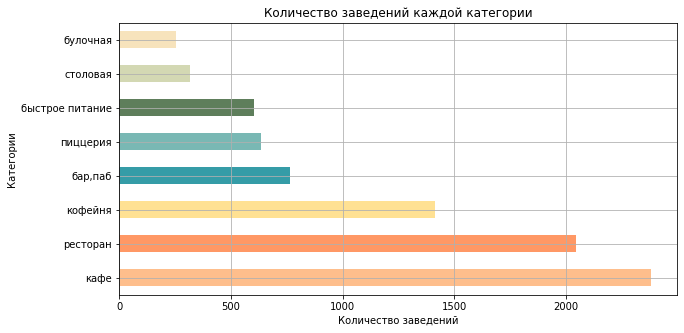

In [28]:
data['category'].value_counts().plot(kind='barh', figsize=(10,5), 
                   color = ["#FEAE6F", "#FF7F3E", "#FFDA78", "#028391", "#57A6A1", "#365E32", "#C8CFA0", "#F6DCAC"], alpha = 0.8, 
                   grid = True)
plt.xticks(rotation=0)

plt.title('Количество заведений каждой категории')
plt.ylabel('Категории')
plt.xlabel('Количество заведений')
plt.show()

**Таким образом**, преобладающее большинство заведений в датафрейме относятся к категориям:
1) 2378 кафе составляют 28.3% от общего числа всех заведений,

2) 2043 ресторанов составляют 24.3% от общего числа всех заведений,

3) 1413 кофеен составляют 16.8% от общего числа всех заведений.      

А вот самая немногочисленная категория - булочная (всего 3%).

###  **Количество посадочных мест. Исследование распределения количества посадочных мест по категориям.**

С помощью метода describe() посмотрим значения в этом столбце:

в датасете присутствуют заведения и вовсе без посадочных мест, и с великим множеством (1288). В основном, количество посадочных мест в большинстве заведений в районе 0-300, что логично, ведь в булочной мест может и не быть, а во многих ресторанах бывает по несколько залов.

In [29]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Построим диаграмму размаха, чтобы убедиться в этом. Действительно, в границы нормальных значений входят заведения с количеством посадочных мест 0-300.

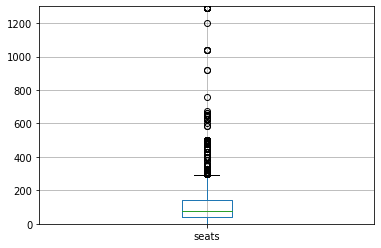

In [30]:
data.boxplot(column=['seats'])
plt.ylim(0,1300)
plt.show()

Построим гистограмму для seats. На ней изображен явный пик количества мест в заведении от 0 до 100.

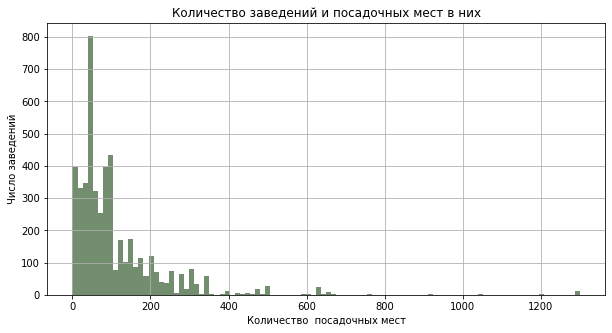

In [31]:
data['seats'].hist(bins=100, figsize=(10, 5), range = (0, 1300), color = '#365E32', alpha = 0.7)
plt.title('Количество заведений и посадочных мест в них')
plt.ylabel('Число заведений')
plt.xlabel('Количество  посадочных мест')
plt.show()

Большинство заведений имеют 0, 40-50 или 100 мест, здесь наблюдаются самые высокие пики.

Посмотрим медианное и среднее количество мест в заведениях общественного питания по категориям.

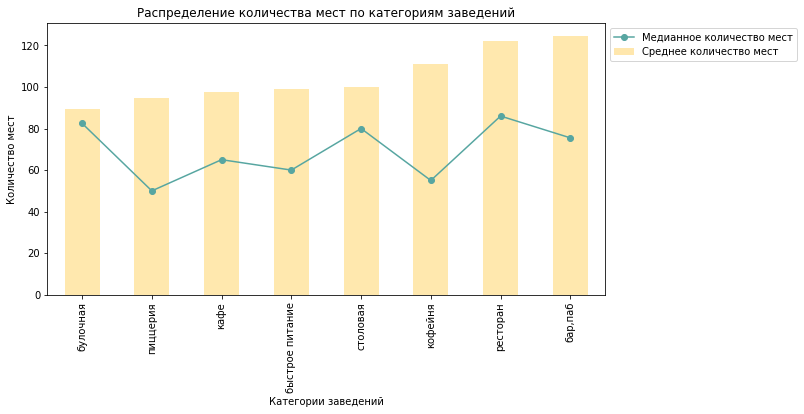

In [32]:
seat_median = data.groupby('category')['seats'].median()
seat_mean = data.groupby('category')['seats'].mean().sort_values()

seat_median.plot(x='category', y='seats', label = 'Медианное количество мест', color='#57A6A1', marker='o',  figsize=(10,5))
seat_mean.plot(x='category', y='seats', label = 'Среднее количество мест', color='#FFDA78', kind='bar', alpha = 0.6, figsize=(10,5))

plt.xlabel('Категории заведений')
plt.ylabel('Количество мест')
plt.title('Распределение количества мест по категориям заведений')
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

**Таким образом**, средние и медианные количества мест существенно отличаются - среднее количество мест оказывается выше медианной. Это значит, что среди заведений есть те, у которых места либо нет совсем, либо их очень много. В основном, у большинства заведений количество мест не превышает 50-80.

### **Соотношение сетевых и несетевых заведений.**

Создадим функцию, которую поместим в новый столбец, где будет указано, является ли заведение сетевым или нет.

In [33]:
def net (row):
    if row['chain'] == 0:
        return 'Несетевое заведение'
    else:
        return 'Сетевое заведение'

In [34]:
data['net'] = data.apply(net, axis=1)

In [93]:
print(data['net'].unique())

['Несетевое заведение' 'Сетевое заведение']


Сгруппируем данные по новому столбцу net.

Видно, что заведений, которые не являются частью сети больше половины.

In [36]:
data.groupby('net')['chain'].count()

net
Несетевое заведение    5201
Сетевое заведение      3205
Name: chain, dtype: int64

Построим круговую диаграмму для визуального сопровождения рассчетов.

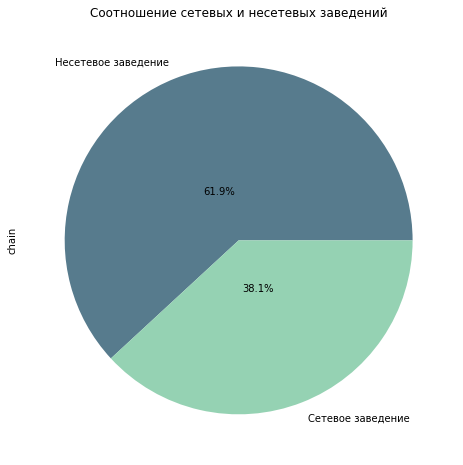

In [37]:
colors = ["#577B8D", "#95D2B3"]
data.groupby('net')['chain'].count().plot(kind='pie', figsize=(8, 8), pctdistance=0.3,
                                     autopct='%1.1f%%', colors = colors)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

Дополнительно можно построить диаграмму солнечные лучи, при наведении курсора на ячейку будет отображено не только количество заведений, входящих или не входящих в число сетей, а также количество заведений внутри групп по категориям. 

In [38]:
fig = px.sunburst(data, path=['net', 'category'], color='net',
                 width=700, height=700, color_discrete_map={'(?)':'#FFE8C8', 'Несетевое заведение':'#577B8D', 'Сетевое заведение':'#95D2B3'},
                  title='Соотношение количества заведений каждой категории по районам')
fig.show()

Далее подробнее посмотрим соотношение сетей и не сетей по категориям.

**Таким образом**, в датафрейме 61.9% от числа всех заведений составляют несетевые заведения (5201) и 38,1% - это сетевые заведения (3205).

По качественному составу сетевые и несетевые не различаются. Единственное, в сетках количество заведений всех категорий, кроме кафе, ресторанов и кофеен распределены по-другому.

###  **Соотношение сетевых и несетевых заведений по категориям.**

Сгруппируем категории и принадложность к сетям по количеству заведений в них, а также построим столбчатую диаграмму.

In [39]:
net = data.groupby(by=['category', 'net'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)

In [40]:
fig = px.bar(net, x='category', y='count', color='net')
fig.update_layout(
    title_text='Cоотношение сетевых и несетевых заведений по категориям',
    title_font_size=20,
    xaxis_title='Категории заведений',
    yaxis_title='Количество заведений')

fig.show()

In [41]:
fig = px.bar(net, x='category', y='count', color='net')
fig.update_layout(
    title_text='Cоотношение сетевых и несетевых заведений по категориям',
    title_font_size=20,
    xaxis_title='Категории заведений',
    yaxis_title='Количество заведений')

fig.update_xaxes(categoryorder="total descending")
fig.show()

Как мы видим на данном графике, практически во всех категориях меньшенство заведений представлены участниками сетей.

Только в булочных, кофейнях и пиццериях превалируют сетевые заведения.

Рассмотрим далее распределение по категориям только тех заведений, которые входят в сети.

In [42]:
chain_1 = data.query('chain == 1').groupby('category')['chain'].count()

Построим бублик, на котором отобразим процентное соотношение категорий внутри сетевых заведений.

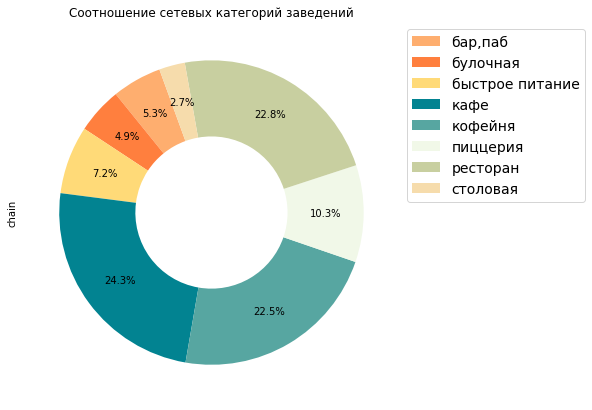

In [43]:
colors = ["#FEAE6F", "#FF7F3E", "#FFDA78", "#028391", "#57A6A1", "#F1F8E8", "#C8CFA0", "#F6DCAC"]
chain_1.plot(kind='pie', figsize=(7, 7), labels=None, pctdistance=0.75, wedgeprops=dict(width=0.5),
                                     autopct='%1.1f%%', startangle=110, colors = colors)
plt.title('Соотношение сетевых категорий заведений')
plt.legend(labels=chain_1.index, loc='upper right', bbox_to_anchor=(1.5,1), fontsize=14)
plt.show()

**Таким образом**, мы узнали, что:

1. Среди булочных, кофеен и пиццерий превалируют сетевые заведения.
2. Большая часть сетевых заведений относится к категориям кафе (24.3% от общего числа), кофейня (22.5%) и рестораны (22.8%).
3. Среди сетей наименее распространены столовые (2.7%).

### **Топ-15 популярных сетей в Москве.**

Отсортируем 15 самых многочисленных сетей. Несколько сетей действительно имеют большую популярность и многим будут знакомы, например, ДоДо пицца или Теремок. Это довольно крупные сети, расположенные не только В москве, но и во многих других городах. 

Но больше всего из этого списка выделяются сети под названием Кафе, Хинкальная, Шаурма и Ресторан. Либо в данных есть ошибки, либо владельцы данных заведений творчески не отнеслись к созданию названия для своей точки (Если с киоском под названием Шаурма мы еще хоть как-то в жизни встречались, то вот с кафе "Кафе" и рестораном "Ресторан" - нет).

In [44]:
#name_groupby = data['name'].value_counts().head(15) 
#name_groupby

In [45]:
top_15 = data[(data['chain'] == 1)].groupby('name')['category'].count().sort_values(ascending = False).head(15)
top_15

name
шоколадница                            120
домино'с пицца                          76
додо пицца                              74
яндекс лавка                            72
one price coffee                        71
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: category, dtype: int64

Построим столбчатую гистограмму по этим сетям.

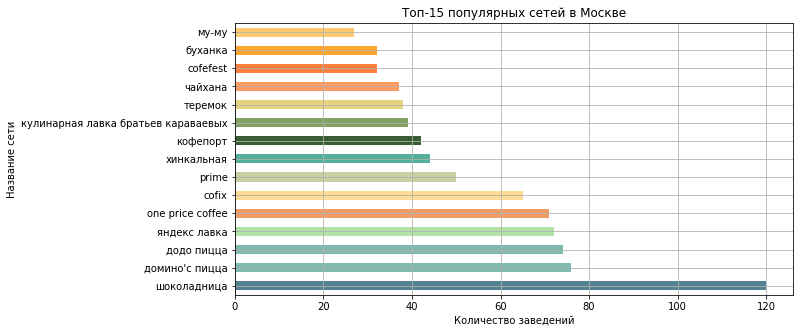

In [46]:
top_15.plot(kind='barh', figsize=(10,5), 
                   color = ["#538392", "#80B9AD", "#80B9AD", "#B3E2A7", 
                            "#EF9C66", "#FCDC94", "#C8CFA0", "#55AD9B", 
                            "#365E32", "#81A263", "#E7D37F", "#FD9B63", 
                            "#FF7F3E", "#FFA62F", "#FFC96F"], grid = True, 
            label = 'Заведения общестренного питания')
plt.title('Топ-15 популярных сетей в Москве')
plt.ylabel('Название сети')
plt.xlabel('Количество заведений')
plt.show()

С отрывом лидирует сеть под названием 'Шоколадница', далее за ними идут сети 'Домино'с пицца' и 'ДоДо пицца'.

А сейчас посмотрим, к каким категориям относятся эти 15 сетей.

In [47]:
new_top_15 = data[(data['chain'] == 1)].groupby(by=['name', 'category'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending = False).head(15)

In [48]:
fig = px.bar(new_top_15, x='name', y='count', color='category')
fig.update_layout(
    title_text='Топ-15 популярных сетей в Москве и их категории',
    title_font_size=20,
    xaxis_title='Название сети',
    yaxis_title='Количество заведений')

fig.update_xaxes(categoryorder="total descending")
fig.show()

**Таким образом**, мы узнали, что:

1. Самыми популярными сетями являются: сеть кофеен "Шоколадница" (120 заведений) и пиццерии Домино'с пицца (76) и ДоДо пицца (74).
2. Несколько сетей известны не только на территории Москвы, но и так же в других городах и регионах (ДоДо пицца, Теремок и Яндекс лавка).
3. В топ-15 сетей входят 6 кофеен, 2 пиццерии, 3 ресторана, 3 кафе и 1 булочная.

### **Распределение заведений каждой категории по районам Москвы.**

Для удобства создаем столбец, в котором более коротко указаны названия районов Москвы. Для этого также создаем функцию.

In [94]:
print(data['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


Всего в датасете 9 административных округов: Северный, Северо-Восточный, Северо-Западный, Западный, Центральный, Восточный, Юго-Восточный, Южный, Юго-Западный.

In [50]:
def short (row):
    if row['district'] == 'Восточный административный округ':
        return 'В АО'
    elif row['district'] == 'Западный административный округ':
        return 'З АО'
    elif row['district'] == 'Северный административный округ':
        return 'С АО'
    elif row['district'] == 'Южный административный округ':
        return 'Ю АО'
    elif row['district'] == 'Центральный административный округ':
        return 'Ц АО'
    elif row['district'] == 'Северо-Восточный административный округ':
        return 'С-В АО'
    elif row['district'] == 'Северо-Западный административный округ':
        return 'С-З АО'
    elif row['district'] == 'Юго-Восточный административный округ':
        return 'Ю-В АО'
    elif row['district'] == 'Юго-Западный административный округ':
        return 'Ю-З АО'
    else:
        return

In [51]:
data['district_short'] = data.apply(short, axis=1)

In [95]:
print(data['district_short'].unique())

['С АО' 'С-В АО' 'С-З АО' 'З АО' 'Ц АО' 'В АО' 'Ю-В АО' 'Ю АО' 'Ю-З АО']


Создаем сводную таблицу, по которой далее построим накопительный график.

In [53]:
district_cat = data.pivot_table(
    index='district_short', 
    columns='category', 
    values='name', 
    aggfunc='count')

district_cat

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district_short,,,,,,,,
В АО,53,25,71,272,105,72,160,40
З АО,50,37,62,239,150,71,218,24
С АО,68,39,58,235,193,77,189,41
С-В АО,63,28,82,269,159,68,182,40
С-З АО,23,12,30,115,62,40,109,18
Ц АО,364,50,87,464,428,113,670,66
Ю АО,68,25,85,264,131,73,202,44
Ю-В АО,38,13,67,282,89,55,145,25
Ю-З АО,38,27,61,238,96,64,168,17


In [54]:
#district_cat.plot.barh(stacked=True, alpha=0.5, figsize=(10,5))
#plt.xlabel('Количество заведений') 
#plt.ylabel('Районы Москвы') 
#plt.title('Распределение заведений по категориям в различных районах Москвы')
#plt.show()

In [55]:
fig = px.bar(data.groupby(['district_short', 'category'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False),
             x="district_short", y="count", color="category")
fig.update_layout(
    title_text='Распределение заведений по категориям в различных округах Москвы',
    title_font_size=20,
    xaxis_title='Округи Москвы',
    yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder="total descending")
fig.show()

Центральный округ является самым многочисленным среди всех. На графике видно, что наиболее в нем распространены такие категории, как:

1) бар,паб;
2) кафе;
3) кофейня;
4) ресторан.

Рассмотрим более детально, как распределены заведения по категориям в разных районах Москвы. Построим тепловую карту.

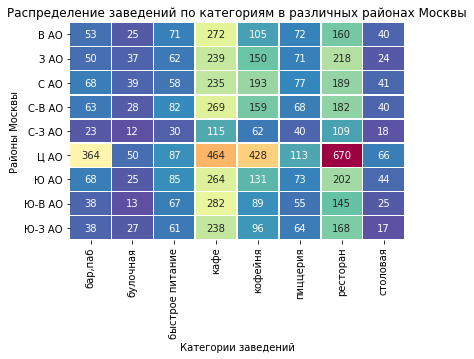

In [56]:
sns.heatmap(district_cat, annot=True, fmt="d", linewidths=0.5, cmap= 'Spectral_r', cbar=False)
plt.title('Распределение заведений по категориям в различных районах Москвы')
plt.ylabel('Районы Москвы')
plt.xlabel('Категории заведений')
plt.show()

Отчетливо видно, что меньше всего заведений всех категорий в Северо-Западном округе. А Центральный округ вмещает столько ресторанов, сколько в сумме в некольких других районах. 

**Таким образом**, мы узнали, что:

1. Самый "пустой" в контексте заведений район Москвы - Северо-Западный. В нем относительно всех категорий превалируют кафе и рестораны.
2. Центральный район густо наполнен ресторанами (670!), кафе, кофейнями и барами.
3. Самая популярная категория заведений во всех округах - кафе.
4. Столовые и булочные не пользуются спросом во всех округах, далее следуют пиццерии и быстрое питание.

### **Распределение средних рейтингов по категориям заведений.**

Сгруппируем средние рейтинги заведений по категориям.

In [57]:
data_mean_rating = data.groupby('category')['rating'].mean().sort_values()
#data_mean_rating = data.groupby('category')['rating'].max().sort_values()

Построим совмещенные графики. Так будет удобнее ориентироваться.

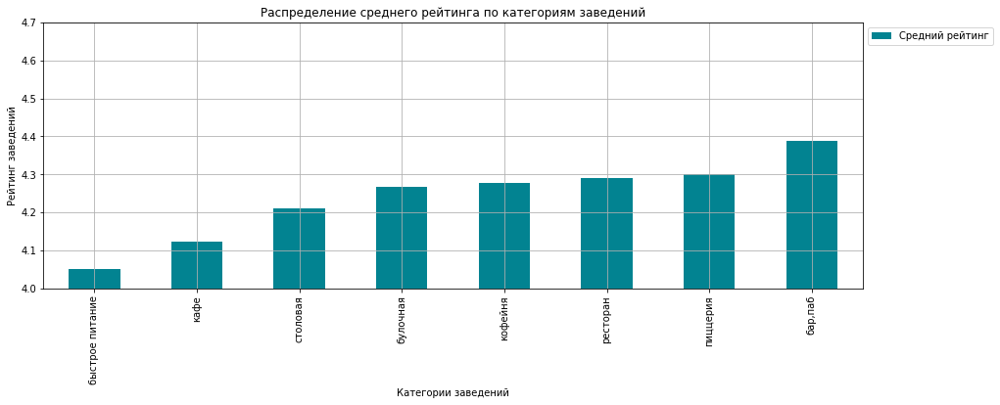

In [58]:
data_mean_rating.plot(x='category', y = 'rating', label='Средний рейтинг', 
                      color='#028391',  kind='bar', figsize=(15,5), grid = True)
plt.ylim(4.0, 4.7)
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг заведений')
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

Так, на этом графике видно, что все они не ниже 4.0 и не выше 4.5. Можно считать, что в среднем люди ставят этим заведениям хорошие рейтинги.

Рассмотрим соотношение медианной и средних оценок рейтингов.

In [59]:
data_median_rating = data.groupby('category')['rating'].median()

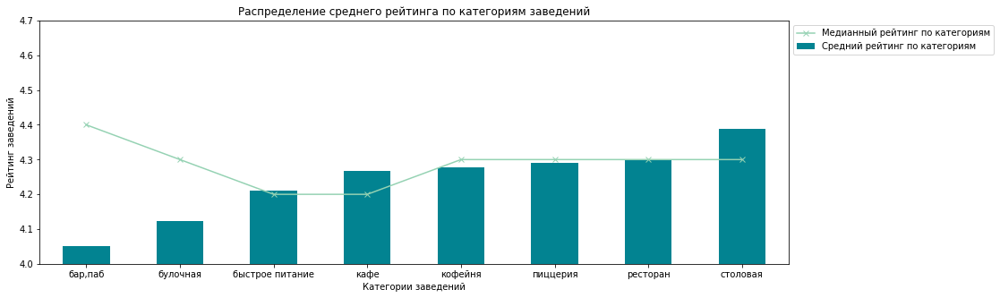

In [60]:
data_mean_rating.plot(x='category', y='rating', 
                   label='Средний рейтинг по категориям', color='#028391',  kind='bar', figsize=(15,5))
data_median_rating.plot(x='category', y='rating', 
                   label='Медианный рейтинг по категориям', marker='x', color='#95D2B3', figsize=(15,5))
plt.ylim(4.0, 4.7)
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг заведений')
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

На графике стали видны пересечения медианного и среднего рейтинга.
- в быстром питании, кофейнях, пиццениях и ресторанах рейтинги пересекаются, значит, у этих категорий нет явно выделяющихся высоких или низких рейтингов.
- в столовых и кафе средний рейтинг выше медианного, значит, есть очень высокие и очень низкие оценки.
- в барах и булочных у большинства заведений рейтинги 4.4 и 4.3.

На графике видно, что зачастую средние рейтинги не слишком отличаются от медианных, а это значит, что в основном, люди действительно хорошо оценивают. В этом плане выбросов нет. Такие оценкии являются самыми популярными значениями с максимальной частотой распределения.

**Таким образом**, мы узнали, что:

1. Наблюдается тенденция к тому, что средний и медианный рейтинг, в основном не слишком различны, а это значит, что оценки выставляются стабильно и без внезапных единиц и двоек. 
2. Допустим, больше всего людям нравятся бары, поэтому оценивают они их практически в 4.4 балла. Ползвезды снимают наверное за то, что зонтик в коктейль не поставили. 
3. В пиццериях посетители стабильно ставят 4.3 балла.
4. Небольшое "провисание" наблюдается в точках быстрого питания - средний рейтинг там ниже, чем медианный. У них больше хороших оценок, но твердую четверочку все равно изредка кто-то ставил. То же самое касается столовых.

### **Построение хороплета со средним рейтингом заведений каждого района.**

Создаем датафрейм, в который поместим средние рейтинги по каждому району Москвы.

In [61]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_district

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


Далее читаем файл и сохраняем его.

In [62]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True)

Далее последовательно импортируем карту, загружаем границы округов Москвы, устанавливаем гео координаты центра Москвы, создаем хороплет.

In [63]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Spectral_r',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Теперь создаем маркеры и кластеры.

In [64]:
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

moscow_lat, moscow_lng = 55.751244, 37.618423

df = pd.read_csv('/datasets/moscow_malls_info.csv')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=128&id=46379&format=png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Spectral_r',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

**Таким образом**, на этом шаге мы:

Построили фоновую картограмму распределения среднего рейтинга по районам Москвы.

Как мы видим на карте и по кластерам заведений:

1. Разница в средних рейтингах особо чувствуется у Центрального (рейтинг выше 4.33) и у Юго-Восточного (менее 4.15).
2. У Центрального округа и средний рейтинг, и количество заведений превышает другие районы.
3. Северо-Западный район, насчитывающий наименьшее число заведений тем не менее имеет более высокий средний рейтинг, чем все остальные округа, исключая Центральный.

In [65]:
from folium import Map, Marker
from folium import plugins
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

moscow_lat, moscow_lng = 55.751244, 37.618423

df = pd.read_csv('/datasets/moscow_malls_info.csv')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

m = folium.Map([55.751244, 37.618423], zoom_start=8)
heatmap = data[['lat','lng']]
m.add_child(plugins.HeatMap(heatmap, radius=14))

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=128&id=46379&format=png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m   

### **Топ-15 улиц по количеству заведений и их категориям.**

Поступим по аналогии с предыдущим заданием, в котором мы искали самые популярные сети. Сгруппируем назвыания улиц по количеству заведений на них.

In [66]:
streets = data.groupby('street')['name'].count().sort_values(ascending = False).head(15).index.tolist()
streets

filtered_data_street = data[data['street'].isin(streets)]

street_top = filtered_data_street.pivot_table(
    index = 'street', 
    columns='category', 
    values = 'name', 
    aggfunc = 'count')
street_top

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
мкад,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


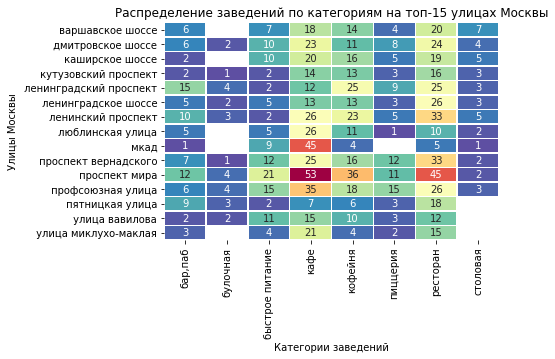

In [67]:
sns.heatmap(street_top, annot=True, linewidths=0.5, cmap= 'Spectral_r', cbar=False)
plt.title('Распределение заведений по категориям на топ-15 улицах Москвы')
plt.ylabel('Улицы Москвы')
plt.xlabel('Категории заведений')
plt.show()

Мы видим, что самая распространенная категория заведений - кафе, затем ресторан и кофейня. Большая часть заведений встречается на тех улицах, которые тянутся от окраин Москвы к центру (самые длинные - Проспект Мира на северо-востоке, Профсоюзная улица и Ленинский проспект на юго-западе, Ленинградское шоссе на севере и МКАД, который опоясывает центр Москвы.)

Построим столбчатую гистограмму, на которой будет видно распеределение категорий заведений на этих 15 улицах Москвы.

In [68]:
top_15_street = filtered_data_street.groupby(by=['street', 'category'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending = False)

fig = px.bar(top_15_street, x='street', y='count', color='category')
fig.update_layout(
    title_text='Топ-15 улиц по количеству заведений и их категориям',
    title_font_size=20,
    xaxis_title='Название улиц',
    yaxis_title='Количество заведений')

fig.update_xaxes(categoryorder="total descending")
fig.show()

**Таким образом**, на этом шаге мы:

Сгруппировали данные по улицам и построили по сводной таблице график.

Как мы видим по графику:

1. На Проспекте Мира расположено самое большое количество заведений, и которых особо выделяются кафе, кофейни и рестораны. Здесь также много заведений быстрого питания.
2. Затем следуют Профсоюзная улица и Проспект Вернадского. В них так же много кофеен, кафе и ресторанов.
3. Бары и пабы концентрируются на Проспекте Мира и Ленинградском проспекте.
4. Булочные прользуются спросом на Ленинградском, Ленинском проспекте, а также на Профсоюзной улице и Проспекте Мира.
5. Любители пиццы чаще всего могут полакомиться ей на Профсоюзной улице, Проспекте Вернадского, Проспекте Мира и на Ленинградском проспекте.
6. А вот большинство столовых находится на Варшавском шоссе и Ленинском проспекте, зато практически отсутствуют на улице Миклухо-Маклая, Вавилова и Пятницкой улице.

### **Улицы, на которых находится только один объект общепита.**

Создаем переменную с названиями улиц, где будет числится хотя бы одно заведение и отфильтруем список.

In [69]:
one_street = data.street.value_counts().to_frame().reset_index()
one_street = one_street.rename(columns = {'index': 'street', 'street': 'count'})
one_street = one_street.query('count == 1')
one_street

,street,count
990,улица академика ильюшина,1
991,золотая улица,1
992,челюскинская улица,1
993,улица розанова,1
994,парк красная пресня,1
...,...,...
1442,улица поликарпова,1
1443,шоссейный проезд,1
1444,ландшафтный заказник лианозовский,1
1445,октябрьский переулок,1


Теперь составим список и сгруппируем по округам и категориям эти одинокие заведения.

In [70]:
lonely = one_street.street.tolist()
lonely_df = data.query('street in @lonely')

In [71]:
one_street = lonely_df.groupby(['district_short', 'category']).agg({'name': 'count'}).rename(columns = {'name': 'count'}).reset_index().sort_values(by = 'count', ascending = False)
one_street

,district_short,category,count
39,Ц АО,кафе,38
42,Ц АО,ресторан,36
40,Ц АО,кофейня,34
36,Ц АО,"бар,паб",23
46,Ю АО,кафе,22
...,...,...,...
30,С-З АО,"бар,паб",1
20,С АО,пиццерия,1
17,С АО,быстрое питание,1
14,З АО,столовая,1


Построим диаграмму для визуального сопровождения рассчетов.

In [72]:
fig = px.bar(one_street,
    x='district_short', y='count', color='category', height=650)
fig.update_layout(
    title_text='Распределение единственных заведений на улицах по категориям',
    title_font_size=20,
    xaxis_title='Округи Москвы',
    yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder="total descending")
fig.show()

In [73]:
#colors = ["#FEAE6F", "#FF7F3E", "#FFDA78", "#028391", "#57A6A1", "#F1F8E8", "#C8CFA0", "#F6DCAC"]
#filtered_data_srteet2.plot(kind='pie', figsize=(7, 7), labels=None, pctdistance=0.75, wedgeprops=dict(width=0.5), autopct='%1.1f%%', startangle=110, colors = colors)
#plt.title('Соотношение категорий на улицах с 1 заведением')
#plt.legend(labels=chain_1.index, loc='upper right', bbox_to_anchor=(1.5,1), fontsize=14)
#plt.show()

**Таким образом**, на этом шаге мы:

Сгруппировали данные по улицам и округам и построили диаграмму распределения категорий по ним.

Как мы видим по графику:
1. В основном, единственными заведениями являются кафе (34.8%), рестораны (20.4%) и кофейни (18.4%).
2. Реже всего на улице с одним единственным заведением будет общепит категории булочная (1.8%), пиццерия (3.3%) и бустрое питание (5.0%).
3. Центральный район занимаел лидирующее место по одиночному расположению заведений.

### **Построение хороплета с медианными значениями стоимости заказа для каждого района.**

Сгруппируем районы Москвы по медианной стоимости заказа.

In [74]:
rating_df2 = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
rating_df2

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Далее последовательно импортируем карту, загружаем границы округов Москвы, устанавливаем гео координаты центра Москвы, создаем хороплет.

In [75]:
from folium import Map, Marker
from folium import plugins
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
from folium.plugins.heat_map import HeatMap


moscow_lat, moscow_lng = 55.751244, 37.618423

df = pd.read_csv('/datasets/moscow_malls_info.csv')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=128&id=46379&format=png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)


Choropleth(
    geo_data=state_geo,
    data=rating_df2,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Spectral_r',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m  

По фоновой картограмме видно, что наибольшая медианная стоимость заказа в Центральном и Западном округах (более 908 р). 

А вот самая низкая медианная стоимость - в Северо-Восточном, Южном и Юго-Восточном округах (менее 542 р).
Промежуточное значение занимают Северный и Север-Западный округа (от 633 до 725 р) и Восточный и Юго-Западный округа (542-633 р).

Сгруппируем не только по медианной стоимости заказа, но и по средней.

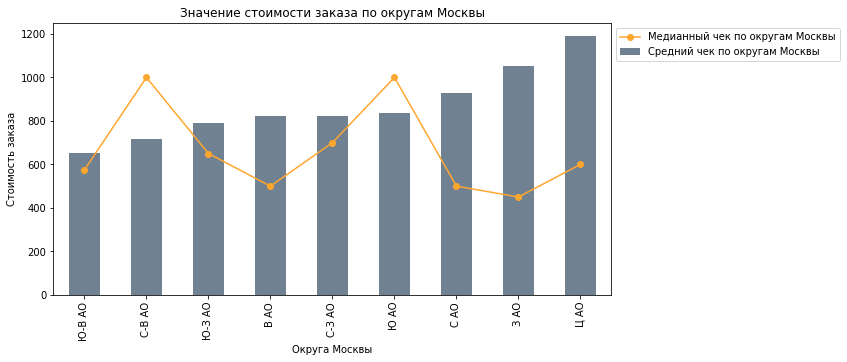

In [76]:
bill_median = data.groupby('district_short')['middle_avg_bill'].median()
bill_mean = data.groupby('district_short')['middle_avg_bill'].mean().sort_values()

bill_median.plot(x='district_short', y='seats', label = 'Медианный чек по округам Москвы', color='#FFA62F', marker='o',  figsize=(10,5))
bill_mean.plot(x='district_short', y='seats', label = 'Средний чек по округам Москвы', color='#344C64', kind='bar', alpha = 0.7, figsize=(10,5))

plt.xlabel('Округа Москвы')
plt.ylabel('Стоимость заказа')
plt.title('Значение стоимости заказа по округам Москвы')
plt.legend(bbox_to_anchor=(1,1), loc='upper left')
plt.show()

На графике видны точки пересечения у некоторых округов Москвы по средним и медианным стоимостям заказа.

**Таким образом**, на этом шаге мы:

Построили фоновую картограмму распределения медианной стоимости заказа по районам Москвы и сгруппировали данные по районам, построили линейный график распределения стоимости по районам.

Как мы видим по графику:
1. Северо-Восточный и Южный округа имеют медианную стоимость заказа, превышающую среднюю. Значит, в этих округах встречались по большей части чеки на один заказ примерно стоимостью 1000р.
2. В Восточном, Северном, Западном и Центральных округах наоборот средняя стоимость заказа выше медианной. Здесь встречались наиболее разрозненные чеки - и слишком высокие, и слишком низкие. Например, большинство заказов в Центральном округе имеют стоимость примерно 600р, однако встречаются заказы и по 1200Р.

## Общий вывод по исследованию рынка общественного питания москвы
<a id="title4"></a>

***Объектом*** исследования был датасет, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В нем находилась информация о заведениях общественного питания Москвы.

***Целью*** исследования было изучение рынка общественного питания в Москве за 2022г.. 

В ***задачи*** исследования входили:
- проведение анализа данных,
- выявление особенностей данного рынка,
- подбор рекомендации для открытия нового заведения,
- подготока презентации исследования для инвесторов. 

В ходе работы было выполнено несколько этапов исследования исходного массива данных:
1 ЭТАП *Сбор данных*

Импортировали все необходимые библиотеки (pandas, matplotlib.pyplot, seaborn, plotly.express, folium, json). Открыли файл. 

Воспользовавшись методом info(), мы узнали, что в таблице 8406 строк и 14 столбцов столбцов. 

В таблице содержалась информация из сервисов Яндекс Карты и Яндекс Бизнес на лето 2022г, включающая название заведения, его категория, адрес и район расположения, информация о времени работы, географические данные (широта, долгота), рейтинг заведения, категория цен, средняя стоимость (блюда, чашки кофе, бокала пива и тд), сетевое ли заведение и количество мест.

2 ЭТАП *Предобработка данных* 

2.1 Поиск пропущенных значений 

В таблице было несколько столбцов с пропусками - middle_coffee_cup (94%), middle_avg_bill (63%), price (61%), avg_bill (55%), seats (43%), hours (6%).

- вывели информацию о проценте и количестве пропусков в каждом столбце, был применен метод .isna().sum().
- в столбцах middle_coffee_cup, middle_avg_bill,  seats решили оставить пропуски, потому что по большей части они не влияют на исследование.
- в столбцах hours, price, avg_bill заполнили пропуски заглушками, был применен метод .fillna().

2.2 Наличие дубликатов в строках

- проверили наличие явных дубликатов в датафрейме, их не обнаружили, применили метод .unique().
- далее проверили наличие неявных дубликатов в категориальных столбцах. Выяснили, что в столбце name встретилось почти сотня строк с написанными в разном регистре и с пробелами дубликаты. Применили методы .str.lower() и .str.strip(), чтоб привести все данные в столбцах к единому нижнему регистру без пробелов в начале и конце записи.
- также в столбце name исправили 'яндекс.лавка' на 'яндекс лавка', применили метод .replace().

2.3 Добавление новых столбцов

- добавили толбец street с названиями улиц из столбца с адресом - благодаря созданию функции, в которой указали, что если в address есть есть элементы, разделенных запятой, то нужно вывести только второй такой элемент (а точнее он будет иметь индекс положения 1).
- добавили is_24_7 с фактом круглосуточной работы заведения создадали функцию, в которой указали, что если в hours встречаются подстроки 'ежедневно' и 'круглосуточно', то логическое значение в новом столбце будет True. В противоположном случае — False.

3 ЭТАП *Анализ данных*

3.1  Категории заведений. Исследование распределения количества объектов общественного питания по категориям.

Преобладающее большинство заведений в датафрейме относятся к категориям: кафе  (28.3%), рестораны (24.3%), кофейни (16.8%). Самая немногочисленная категория - булочные (всего 3%).

3.2  Количество посадочных мест. Исследование распределения количества посадочных мест по категориям.

Среди заведений есть те, у которых места либо нет совсем, либо их очень много. В основном, у большинства заведений количество мест не превышает 50-80.

3.3  Соотношение сетевых и несетевых заведений.

В датафрейме 61.9% от числа всех заведений составляют несетевые заведения (5201) и 38,1% - это сетевые заведения (3205).

3.4  Соотношение сетевых и несетевых заведений по категориям.

- Среди булочных, кофеен и пиццерий превалируют сетевые заведения.
- Большая часть сетевых заведений относится к категориям кафе (24.3% от общего числа), кофейня (22.5%) и рестораны (22.8%).
- Среди сетей наименее распространены столовые (2.7%).

3.5  Топ-15 популярных сетей в Москве.

- Самыми популярными сетями являются: сеть кофеен "Шоколадница" (120 заведений) и пиццерии Домино'с пицца (76) и ДоДо пицца (74).
- Несколько сетей известны не только на территории Москвы, но и так же в других городах и регионах (ДоДо пицца, Теремок и Яндекс лавка).
- В данных есть множество недочетов, поскольку информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Есть вероятность того, что пользователи неверно указывали название и категории заведений.

3.6  Распределение заведений каждой категории по районам Москвы.

- Самый "пустой" в контексте заведений район Москвы - Северо-Западный. В нем относительно всех категорий превалируют кафе и рестораны.
- Центральный район густо наполнен ресторанами (670!), кафе, кофейнями и барами.
- Самая популярная категория заведений во всех округах - кафе.
- Столовые и булочные не пользуются спросом во всех округах, далее следуют пиццерии и быстрое питание.

3.7  Распределение средних рейтингов по категориям заведений.

- Наблюдается тенденция к тому, что средний и медианный рейтинг, в основном не слишком различны, а это значит, что оценки выставляются стабильно и без внезапных единиц и двоек.
- Допустим, больше всего людям нравятся бары, поэтому оценивают они их практически в 4.4 балла.
- В пиццериях посетители стабильно ставят 4.3 балла.
- Небольшое "провисание" наблюдается в точках быстрого питания - средний рейтинг там ниже, чем медианный. У них больше хороших оценок, но твердую четверочку все равно изредка кто-то ставил. То же самое касается столовых.

3.8  Построение хороплета со средним рейтингом заведений каждого района.

- Разница в средних рейтингах особо чувствуется у Центрального (рейтинг выше 4.33) и у Юго-Восточного (менее 4.15).
- У Центрального округа и средний рейтинг, и количество заведений превышает другие районы.
- Северо-Западный район, насчитывающий наименьшее число заведений тем не менее имеет более высокий средний рейтинг, чем все остальные округа, исключая Центральный.

3.9  Топ-15 улиц по количеству заведений и их категориям.

- На Проспекте Мира расположено самое большое количество заведений, и которых особо выделяются кафе, кофейни и рестораны. Здесь также много заведений быстрого питания.
- Затем следуют Профсоюзная улица и Проспект Вернадского. В них так же много кофеен, кафе и ресторанов.
- Бары и пабы концентрируются на Проспекте Мира и Ленинградском проспекте.
- Булочные прользуются спросом на Ленинградском, Ленинском проспекте, а также на Профсоюзной улице и Проспекте Мира.
- Любители пиццы чаще всего могут полакомиться ей на Профсоюзной улице, Проспекте Вернадского, Проспекте Мира и на Ленинградском проспекте.
- А вот большинство столовых находится на Варшавском шоссе и Ленинском проспекте, зато практически отсутствуют на улице Миклухо-Маклая, Вавилова и Пятницкой улице.

3.10  Улицы, на которых находится только один объект общепита.

- В основном, единственными заведениями являются кафе (34.8%), рестораны (20.4%) и кофейни (18.4%).
- Реже всего на улице с одним единственным заведением будет общепит категории булочная (1.8%), пиццерия (3.3%) и бустрое питание (5.0%).

3.11  Построение хороплета с медианными значениями стоимости заказа для каждого района.

- Наибольшая медианная стоимость заказа в Центральном и Западном округах (более 908 р).
- Самая низкая медианная стоимость - в Северо-Восточном, Южном и Юго-Восточном округах (менее 542 р). Промежуточное значение занимают Северный и Север-Западный округа (от 633 до 725 р) и Восточный и Юго-Западный округа (542-633 р).
- Поскольку средняя стоимость заказа превышает медианную, то это значит, что периодически в таблице встречаются цены на заказ выше или ниже большинства чеков.
- В Северо-Западном и Западном округе разница небольшая, а значит в большинстве заведений заказ будет стоить примерно 1000р.
- В Северном и Южном округах разница между медианной стоимостью и средней больше, чем в других округах, а значит, там можно встретить заведения, где стоимость заказа будет или ниже, или выше стоимости большинста заказов по этим округам.

## Предложения для открытия нового заведения
<a id="title5"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Для этого нам потребуется ответить на некоторые вопросы.

### **Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

Сгруппируем категории, но при этом определим, что категория в выборке должна быть только 'кофейня'.

In [77]:
cafe = data.loc[data['category'] == 'кофейня'].groupby('category')['category'].count()
cafe

category
кофейня    1413
Name: category, dtype: int64

Итого, в нашем датасете отказалось 1413 заведений категории 'кофейня', а это 16.8% от общего числа заведений.

Сгруппируем категории по районам, чтобы определить, в каких районах кофеен больше всего, каковы особенности их расположения?

In [78]:
coffee_house = data.query('category == "кофейня"').groupby('district_short')['category'].count().sort_values()
coffee_house 

district_short
С-З АО     62
Ю-В АО     89
Ю-З АО     96
В АО      105
Ю АО      131
З АО      150
С-В АО    159
С АО      193
Ц АО      428
Name: category, dtype: int64

Теперь построим диаграмму, чтоб понять, как распеделилось количество кофеен по районам.

In [79]:
#colors = ["#FEAE6F", "#FF7F3E", "#FFDA78", "#577B8D", "#028391", "#57A6A1", "#F1F8E8", "#C8CFA0", "#F6DCAC"]
#coffee_house.plot(kind='pie', figsize=(8, 8), wedgeprops=dict(width=0.5), autopct='%1.1f%%', startangle=110, colors = colors)
#plt.title('Распределение заведений категории "кофейня" по районам Москвы')
#plt.show()

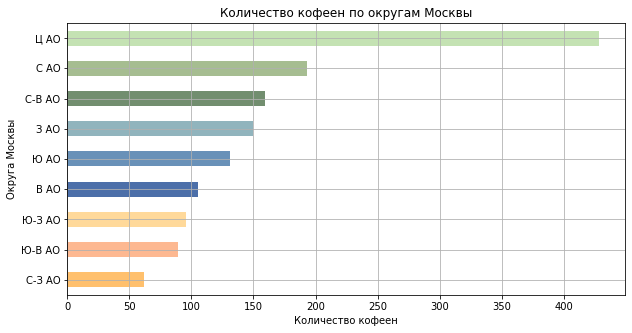

In [80]:
coffee_house.plot(x='district_short', y='category',
                  color= ["#FFA62F", "#FD9B63", "#FFC96F", "#003285", "#2A629A", "#6295A2", "#365E32", "#81A263", "#ACD793"], 
                  kind='barh', alpha = 0.7, figsize=(10,5), grid = True)
plt.xlabel('Количество кофеен')
plt.ylabel('Округа Москвы')
plt.title('Количество кофеен по округам Москвы')
plt.show()

<div class="alert alert-block alert-danger">
    
**Комментарий ревьювера (недочет, который нужно доработать)**
    
Замени круговую диаграмму на барплот.


</div>

<div class="alert alert-block alert-info">
<b>КОММЕНТАРИЙ ОТ УЧЕНИКА:</b><br>
    Заменила свои крожочки и бублики на столбчатую диаграмму.
</div>

<div class="alert alert-block alert-success">

**Комментарий ревьювера v2 (все отлично)**
    
Принято👍
</div>

**Таким образом**, на этом графике мы видим, что:
- наибольшее число кофеен расположено в Центральном округе Москвы (30.3% от общего числа).
- затем идут Северный (13.7%), Северо-Восточный (11.3%) и Западный округа (10.6%).
- Северо-Западный район характерен тем, что в нем расположено наименьшее число кофеен (4.4%).
- можно отметить, что практически ВСЯ южная часть Москвы насчитывает лишь 6-9% кофеен.

### **Есть ли круглосуточные кофейни?**

Чтобы ответить на эти вопросы необходимо провести группировку и построить по ней столбчатую диаграмму.

In [81]:
is_24_7 = data.query('category == "кофейня"').groupby(by=['district_short', 'is_24_7'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)

In [82]:
fig = px.bar(is_24_7, x='district_short', y='count', color='is_24_7', height=650)
fig.update_layout(
    title_text='Распределение круглосуточных и некруглосуточных кофеен в округах Москвы',
    title_font_size=20,
    xaxis_title='Округа Москвы',
    yaxis_title='Количество заведений')
fig.show()

Среди всех кофеен есть как круглосуточные, так и нет. 

При этом такое явление встречается в каждом из районов Москвы.

Примечательно, что в соотношении круглосуточных и некруглосуточных кофеен, количество круглосуточных во много раз уступает. 

Внимательнее изучим процентное соотношение круглосуточных и некруглосутучных кофеен.

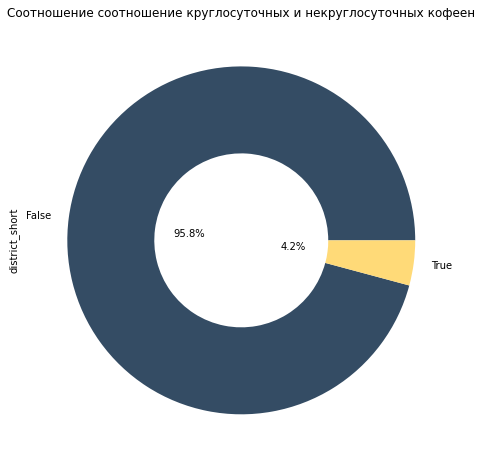

In [83]:
colors = ["#344C64", "#FFDA78"]
data.query('category == "кофейня"').groupby('is_24_7')['district_short'].count().plot(kind='pie', figsize=(8, 8), pctdistance=0.3, wedgeprops=dict(width=0.5),
                                     autopct='%1.1f%%', colors = colors)
plt.title('Соотношение соотношение круглосуточных и некруглосуточных кофеен')
plt.show()

Всего у нас 59 круглосуточных кофеен (4.2%) и 1354 некруглосуточных (95.8%).

По этим графикам мы видим, что кофейни в большинстве случаев некруглосуточные:

- в Центральном округе их больше всего - 402, а меньше всего - в Северо-Западном (60).
- В Центральном округе также насчитывается больше всего круглосуточных кофеен - 26. В Юго-Восточном и Южном - только по 1 такой кофейне.

### **Какие у кофеен рейтинги? Как они распределяются по районам?**

Теперь посмотрим, какие в основном, рейтинги у кофеен и как они распределены по районам.

In [84]:
avg_rating = data.query('category == "кофейня"').groupby('district_short')['rating'].mean().sort_values(ascending=False)

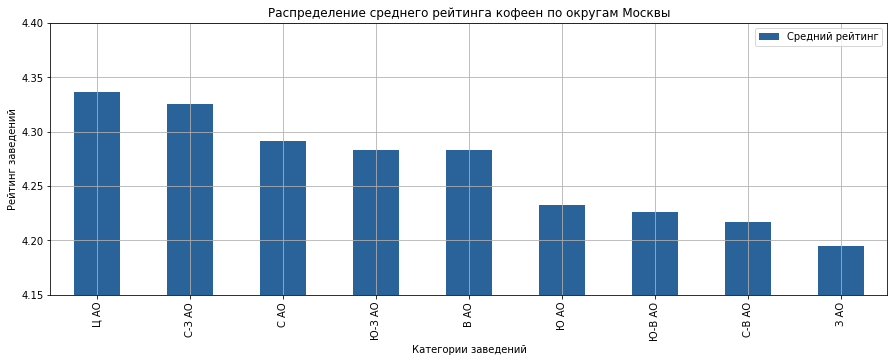

In [85]:
avg_rating.plot(label='Средний рейтинг', color='#2A629A',  kind='bar', figsize=(15,5), grid = True)
plt.ylim(4.15, 4.4)
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг заведений')
plt.title('Распределение среднего рейтинга кофеен по округам Москвы')
plt.legend()
plt.show()

Как мы видим на графиках:
- самый высокий средний рейтинг в Центральном округе среди всех округов (составляет 4.34 балла). 
- самый низкий средний рейтинг имеется у Западного округа составляет 4.2 балла.

### **На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

Из описания данных следует, что стандартное отклонение на 88.9 превышает среднее значение, есть выбросы.

In [86]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Построим диаграмму размаха и посмотрим, какое количество данных входит в нормальные значения. Сразу виден тот самый выброс - чашка капучино за 1568р. Нижний 'ус' упирается в минимальное значение 55h. Верхний 'ус' заканчивается около 380 и входит в  1,5 межквартильного размаха, добавленного к 3-му квартилю.

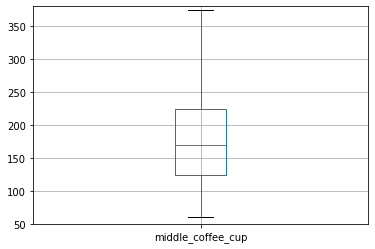

In [87]:
data.boxplot(column=['middle_coffee_cup'])
#plt.ylim(0, 1600)
plt.ylim(50, 380)
plt.show()

Построим гистограмму, чтобы зрительно оценить результат.

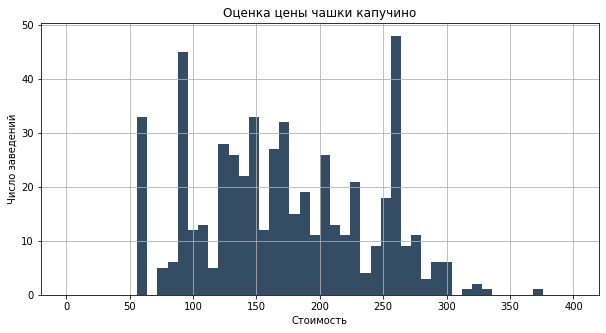

In [88]:
data['middle_coffee_cup'].hist(bins=50, figsize=(10,5), range = (0, 400), color = '#344C64', grid = True)
plt.title('Оценка цены чашки капучино')
plt.ylabel('Число заведений')
plt.xlabel('Стоимость')
plt.show()

В большинстве заведений цена чашки капучино может варьировать от 60 до 230 р.

Теперь узнаем, как может варьировать цена чашки капучино в кофейнях в разных районах Москвы.

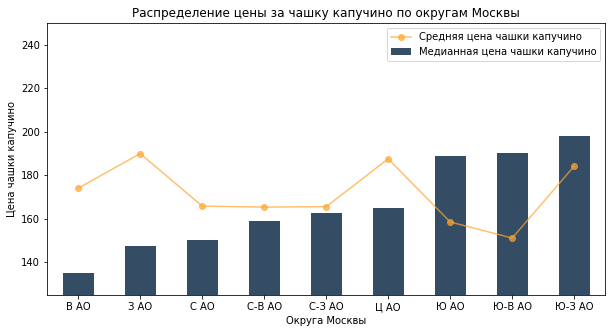

In [89]:
bill_median = data.query('category == "кофейня"').groupby('district_short')['middle_coffee_cup'].median().sort_values()
bill_mean = data.query('category == "кофейня"').groupby('district_short')['middle_coffee_cup'].mean()

bill_median.plot(x='district_short', y='middle_coffee_cup', label = 'Медианная цена чашки капучино', figsize=(10,5), color='#344C64', kind='bar')
bill_mean.plot(x='district_short', y='middle_coffee_cup', label = 'Средняя цена чашки капучино', color='#FFA62F', marker='o', alpha = 0.7, figsize=(10,5))
plt.ylim(125, 250)
plt.xlabel('Округа Москвы')
plt.ylabel('Цена чашки капучино')
plt.title('Распределение цены за чашку капучино по округам Москвы')
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Как мы видим по графику:
1. У некоторых округов (ВСЯ южная часть Москвы) медианная стоимость чашки капучино превышает среднюю, цена на капучино в большинстве случаев выше 180р. В Юго-Западном округе наблюдается самая высокая цена за чашку капучино - она может достигать 200р. Однако, самая назкая средняя цена в Юго-Восточном округе.
2. У большинства районов средняя стоимость чашки капучино превышает медианную, то это значит, что периодически в таблице встречаются цены на капучино выше или ниже большинства чеков.
3. В Восточном, Центральном и Западном округах Москвы особенно видна разница между медианной и средней стоимостью капучино - в Восточном округе чаще всего встречается капучино за 120р (это самый бюджетный вариант кофепития). Но если посмотреть на срежднюю стоимость капучино - то это самые дорогие округи.

# **Рекомендации для открытия нового заведения**

Если инвесторы хотят открыть доступную и популярную кофейню, то им нужно уделить внимание на несколько факторов:

1. Месторасположение
2. Режим работы
3. Отзывы о теоретических конкурентах
4. Стоимость 1 чашки капучино

Рассмотрим для открытия несколько районов, а в от этого будем отталкиваться по другим факторам.

- В случае, если нас заинтересует Центральный округ:

Именно в нем расположено наибольшее число кофеен, отзывы в большинстве своем более 4.0 баллов. Среди этих кофеен превалируют некруглосуточные. Круглосуточных только 26. Это значит, что режим работы нового заведения может стать круглосуточным, и стоимость чашки капучино будет в районе 180р.

***В Центральном округе вероятность успешного открытия кофейни более высок, к тому же она может иметь любой график работы.***

- В случае, если нас заинтересует Северная часть города:

Районы в этой части города в своей сумме имеют почти такое же количество кофеен как в Центральном округе. 
В них расположено наименьшее число кофеен как таковых, отзывы в большинстве своем также более 4.0 баллов. Также относительно других округов, здесь большее количество заведений имеет рейтинг 5.0. Круглосуточных кофеен в этих районах только 3-5. Возможно, такой режим работы тут неактуален, стоимость чашки капучино должна быть 160р. 

- В случае, если нас заинтересует Южная часть города:

Районы в этой части города в своей сумме имеют почти такое же количество кофеен как в Центральном округе. Здесь только по 1 круглосуточной кофейне, что показывает неактуальность такого режима. В Юго-Восточном и Юго-Западном районах ценник на капучино должен быть в 150р соответственно (Юго-Западный округ - 180р).

## Презентация
<a id="title6"></a>

Презентация:  https://disk.yandex.ru/i/SPseghtZo0PLiw